In [150]:
import torch
import sys
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import cv2
import glob
from tqdm.auto import tqdm
from monai.inferers import sliding_window_inference

In [151]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

ROOT = Path.cwd().parent.parent
DATA_DIR = ROOT / 'data'
CKPT_DIR = ROOT / 'checkpoints'
RESULTS_DIR = ROOT / 'figures' / 'comparisons'
TEST_DIR = DATA_DIR / 'test'

USE_GREEN = False
BATCH_SIZE = 1
IM_SIZE = 512
THRESHOLD = 0.6

RESULTS_DIR.mkdir(parents=True, exist_ok=True)

WEIGHT_PATHS = glob.glob(str(CKPT_DIR / '*/*/best_model.pth'))

In [152]:
sys.path.append(str(ROOT / 'src'))
from models.unet import UNet
from data.dataset import *
from utils import convert_to_binary, compute_dice_iou_sample

In [153]:
test_loader = make_test_loader(
    data_root=DATA_DIR,
    im_size=IM_SIZE,
    batch_size=BATCH_SIZE,
    num_workers=0,
    use_green_channel=USE_GREEN
)

In [154]:
def load_model(weight_path):
    """
    Load a trained model from a checkpoint file

    Args:
        weight_path: Path to the model weights file
    """
    ckpt = torch.load(weight_path, map_location=DEVICE)
    model = UNet(**ckpt['model_config'])
    model.load_state_dict(ckpt['state_dict'])
    model = model.to(DEVICE).eval()

    model_config = ckpt['model_config']
    features = model_config['features']
    depth = len(features) - 1
    if model_config['norm_type'] == None:
        return None, None

    upsampling_mode = model_config['up_mode']
    if model_config['block_type'] == 'base':
        model_name = 'UNET'
    elif model_config['block_type'] == 'residual':
        model_name = 'ResUNET'
    model_name += f'[{features[0]}-{depth}]'  

    if upsampling_mode == 'nearest':
        return model, f'{model_name} (Best)' 
    return model, model_name

def load_models():
    models = {}
    for weight_path in WEIGHT_PATHS:
        model, model_name = load_model(weight_path)
        if model is not None:
            models[model_name] = model
    return models

models = load_models()

In [155]:
def visualize(img, gt, preds, dices, ious, save_path):
    img = img.squeeze().permute(1, 2, 0).cpu().numpy()[:, :, :3]
    gt = gt.squeeze().cpu().numpy()
    preds = {name: pred.squeeze().cpu().numpy() for name, pred in preds.items()}

    num_models = len(preds)
    n_cols = 4
    n_rows = 2

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
    axes[0, 0].imshow(img, cmap='gray')
    axes[0, 0].set_title('Input')

    axes[0, 1].imshow(gt, cmap='gray')
    axes[0, 1].set_title('Label')

    for i, (model_name, pred) in enumerate(preds.items()):
        row = (i + 2) // n_cols
        col = (i + 2) % n_cols
        axes[row, col].imshow(pred, cmap='gray')
        axes[row, col].set_title(f'{model_name}\nDice: {dices[model_name]:.2f}, IoU: {ious[model_name]:.2f}')
    for ax in axes.flat:
        ax.axis('off')
    plt.tight_layout()
    plt.savefig(save_path, bbox_inches='tight', dpi=300)
    plt.show()

Evaluating:   0%|          | 0/20 [00:00<?, ?it/s]/Users/toanly/Main/Class/Deep Learning/CS-5137-Deep-Learning/.venv/lib/python3.11/site-packages/monai/inferers/utils.py:226: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:312.)
  win_data = torch.cat([inputs[win_slice] for win_slice in unravel_slice]).to(sw_device)
/Users/toanly/Main/Class/Deep Learning/CS-5137-Deep-Learning/.venv/lib/python3.11/site-packages/monai/inferers/utils.py:370: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpre

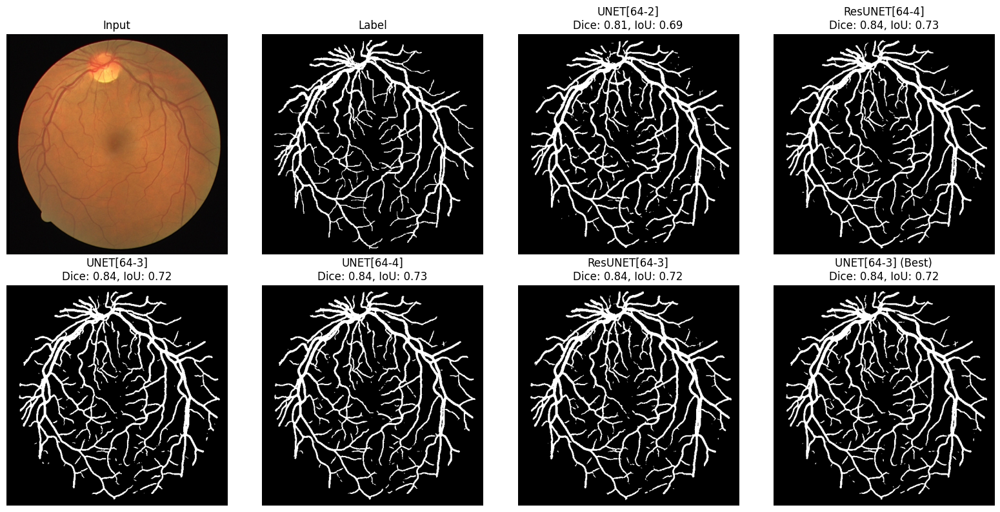

Evaluating:   5%|▌         | 1/20 [00:11<03:29, 11.01s/it]

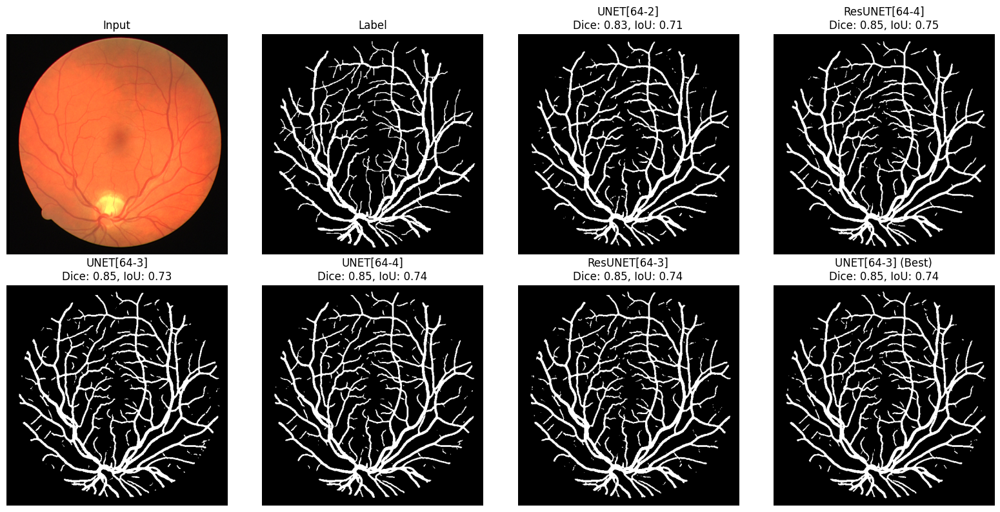

Evaluating:  10%|█         | 2/20 [00:21<03:17, 10.95s/it]

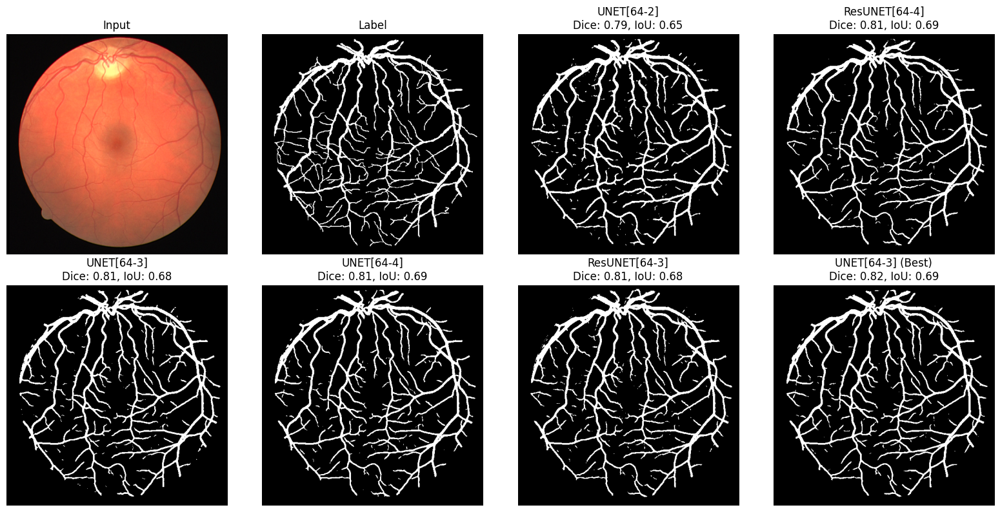

Evaluating:  15%|█▌        | 3/20 [00:32<03:06, 10.98s/it]

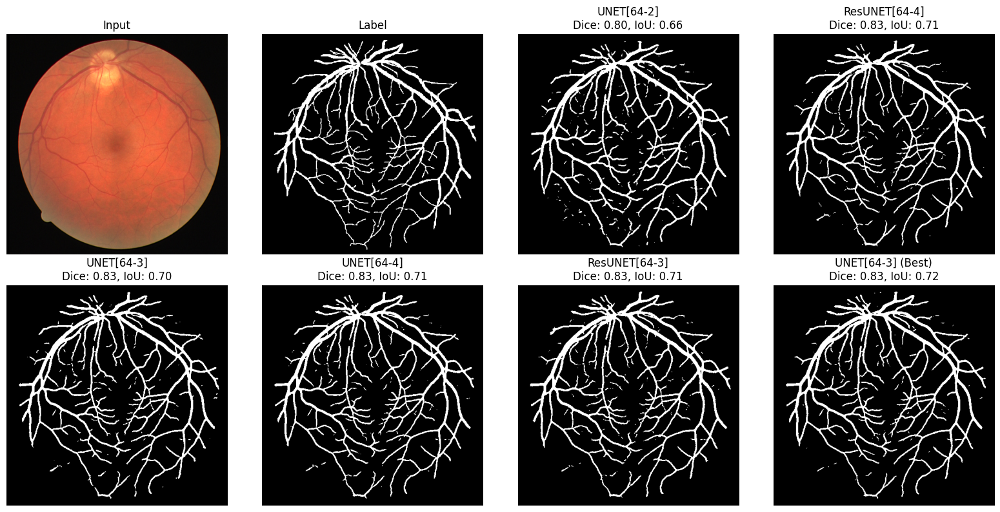

Evaluating:  20%|██        | 4/20 [00:44<02:57, 11.09s/it]

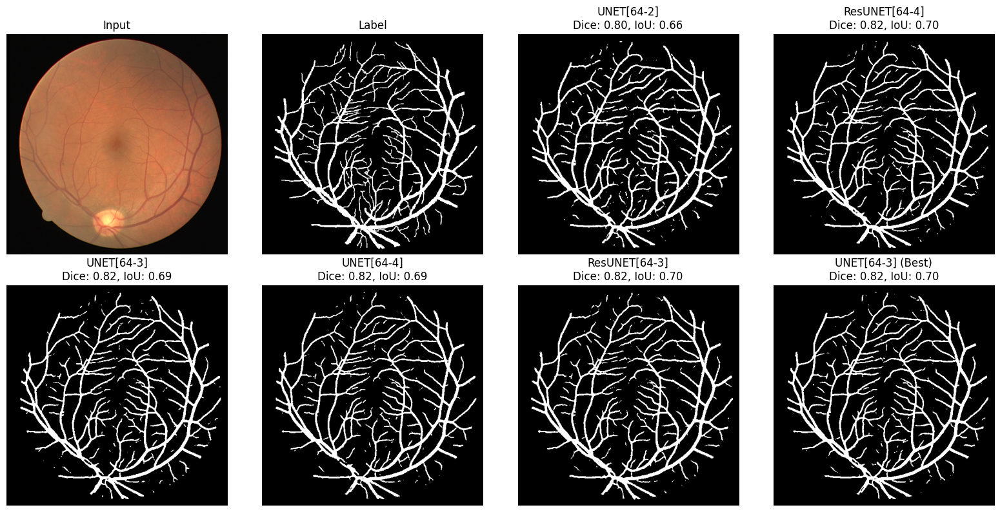

Evaluating:  25%|██▌       | 5/20 [00:55<02:46, 11.11s/it]

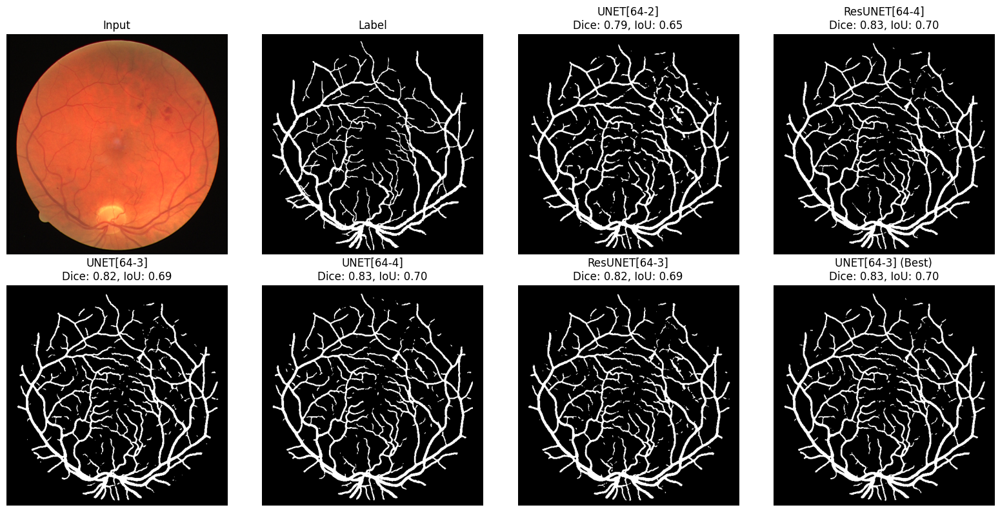

Evaluating:  30%|███       | 6/20 [01:06<02:36, 11.17s/it]

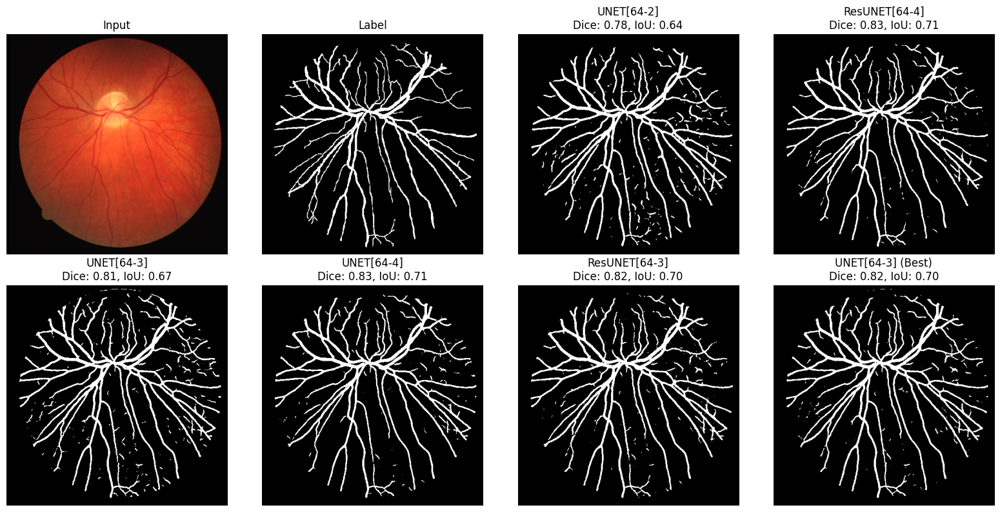

Evaluating:  35%|███▌      | 7/20 [01:17<02:25, 11.21s/it]

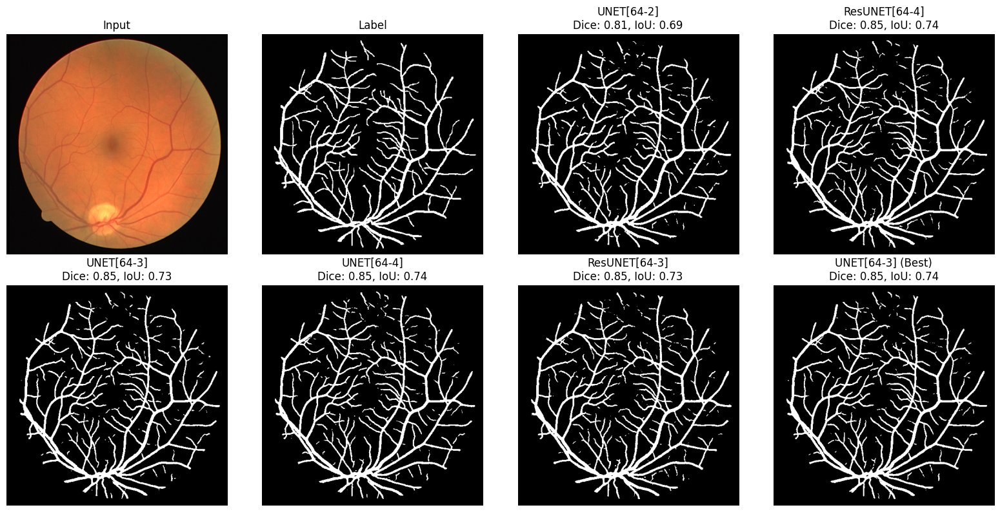

Evaluating:  40%|████      | 8/20 [01:28<02:13, 11.14s/it]

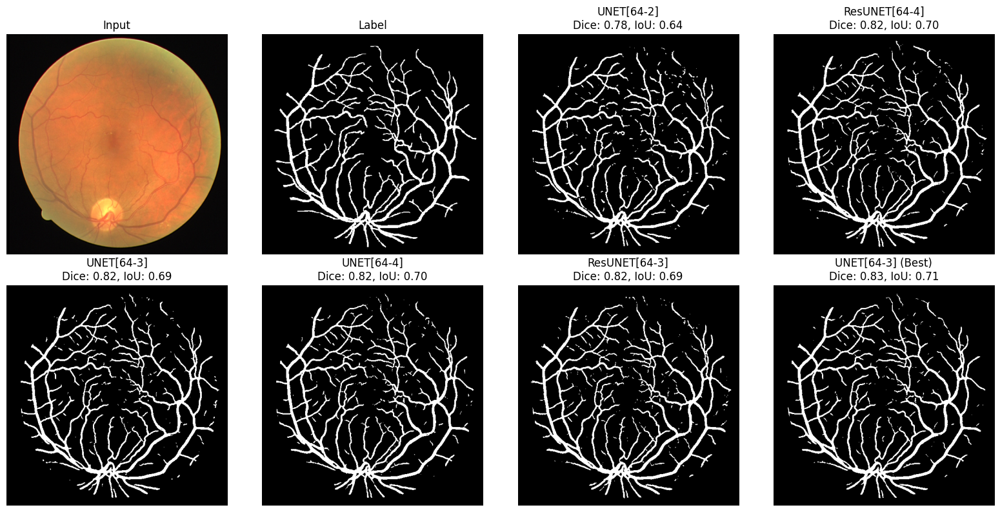

Evaluating:  45%|████▌     | 9/20 [01:39<02:02, 11.11s/it]

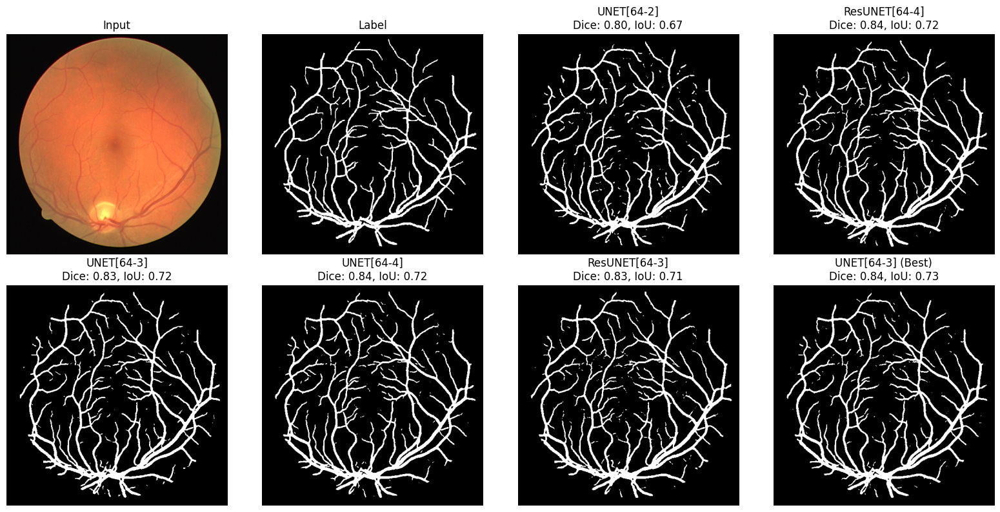

Evaluating:  50%|█████     | 10/20 [01:51<01:51, 11.15s/it]

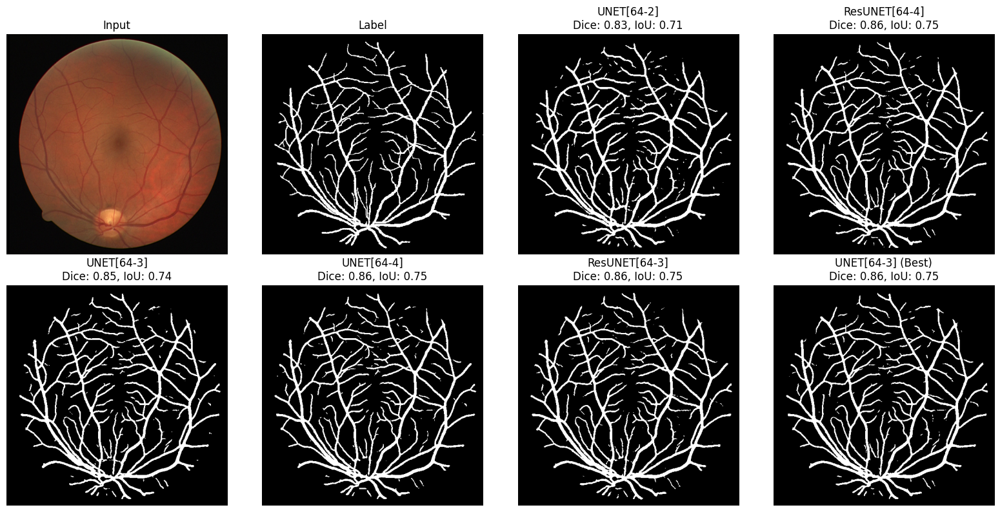

Evaluating:  55%|█████▌    | 11/20 [02:02<01:41, 11.27s/it]

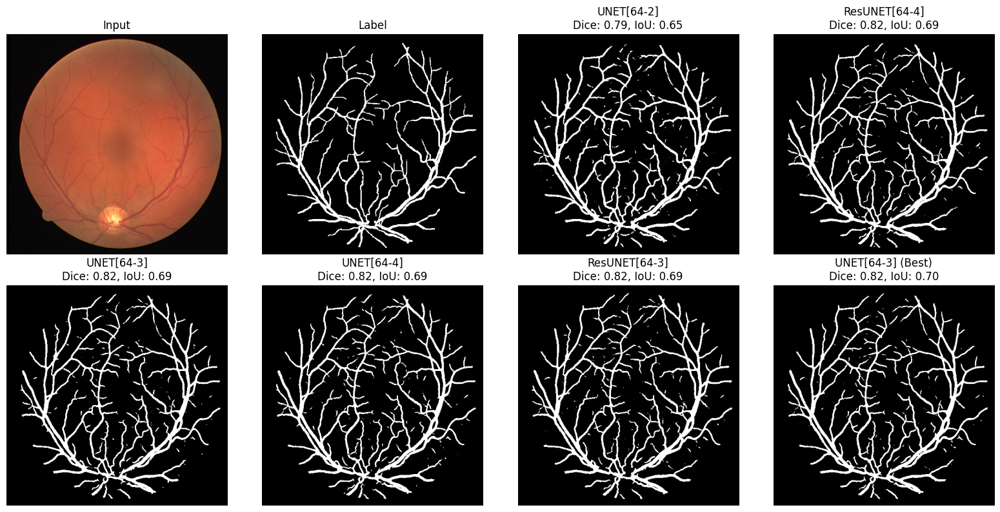

Evaluating:  60%|██████    | 12/20 [02:13<01:29, 11.22s/it]

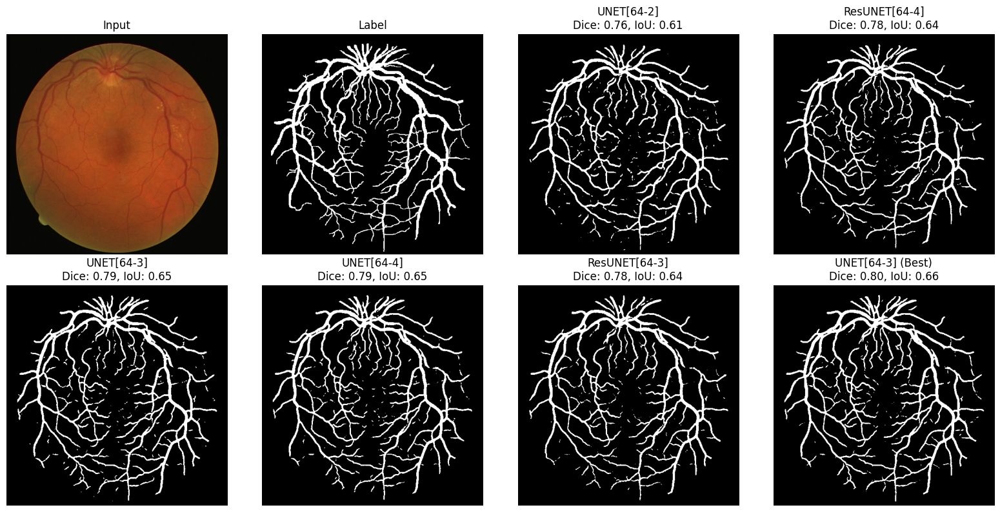

Evaluating:  65%|██████▌   | 13/20 [02:24<01:18, 11.19s/it]

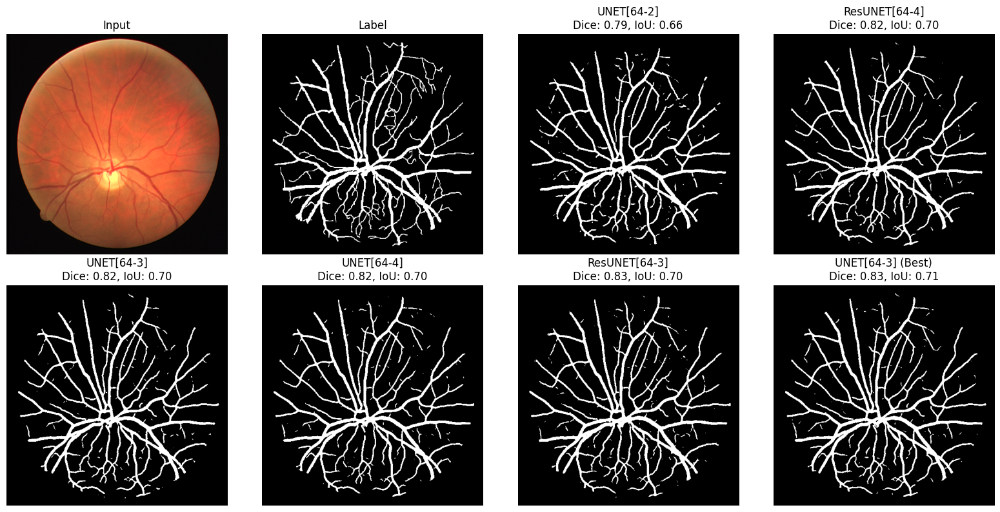

Evaluating:  70%|███████   | 14/20 [02:36<01:07, 11.28s/it]

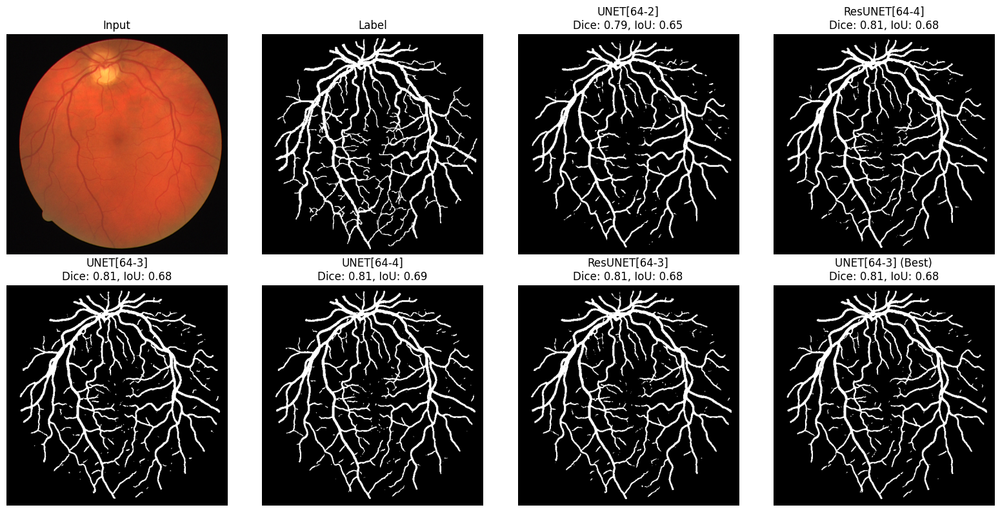

Evaluating:  75%|███████▌  | 15/20 [02:48<00:56, 11.39s/it]

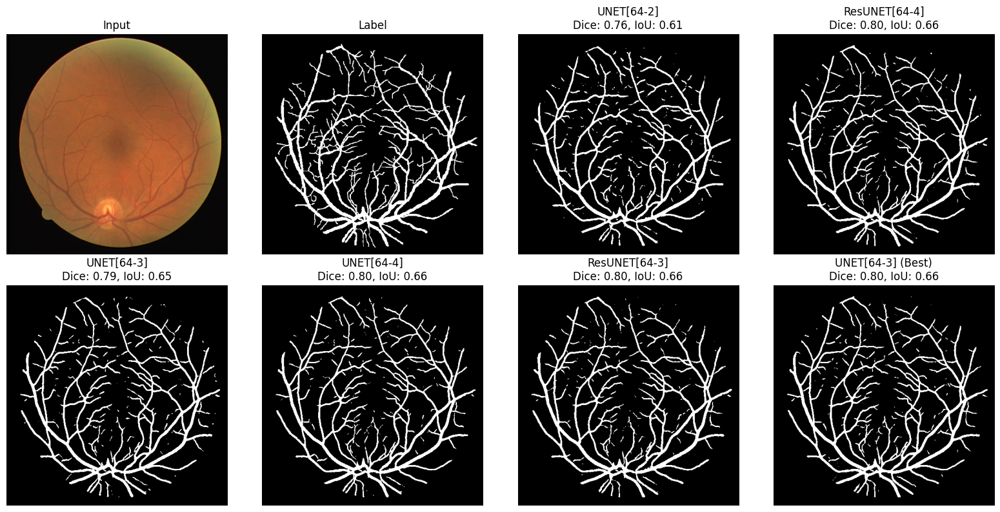

Evaluating:  80%|████████  | 16/20 [02:59<00:45, 11.37s/it]

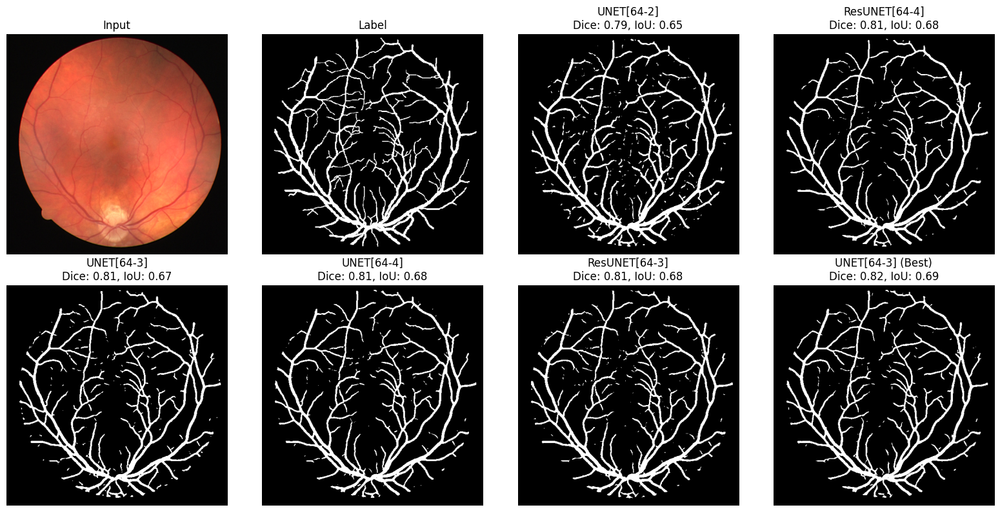

Evaluating:  85%|████████▌ | 17/20 [03:10<00:34, 11.38s/it]

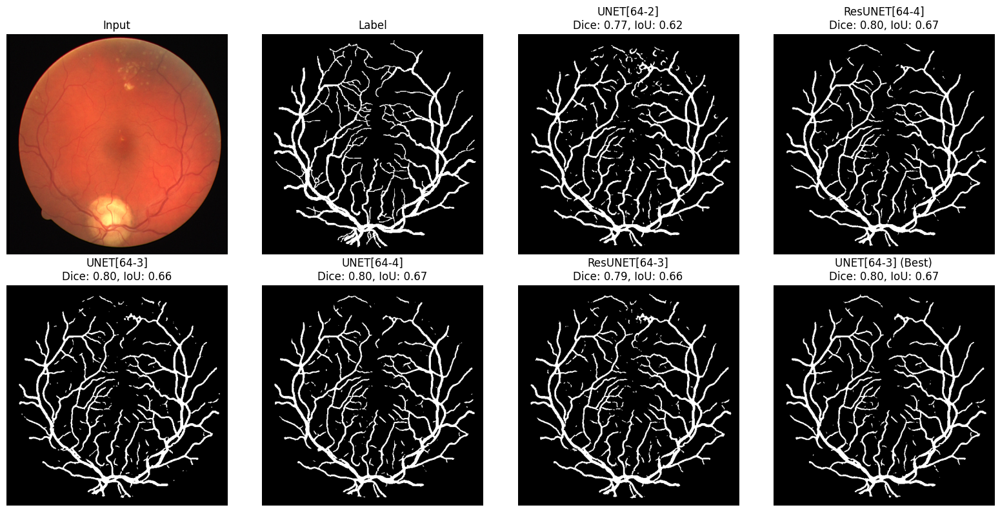

Evaluating:  90%|█████████ | 18/20 [03:22<00:22, 11.39s/it]

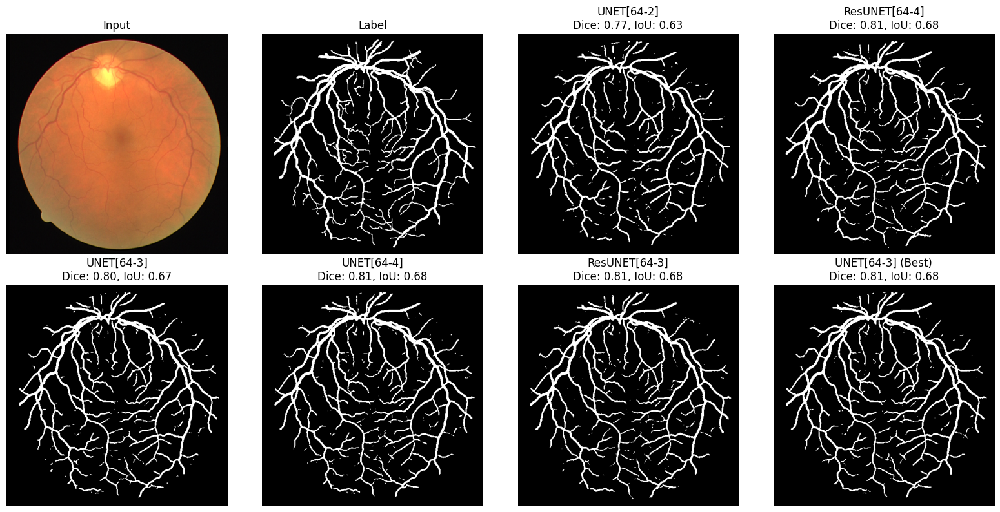

Evaluating:  95%|█████████▌| 19/20 [03:33<00:11, 11.38s/it]

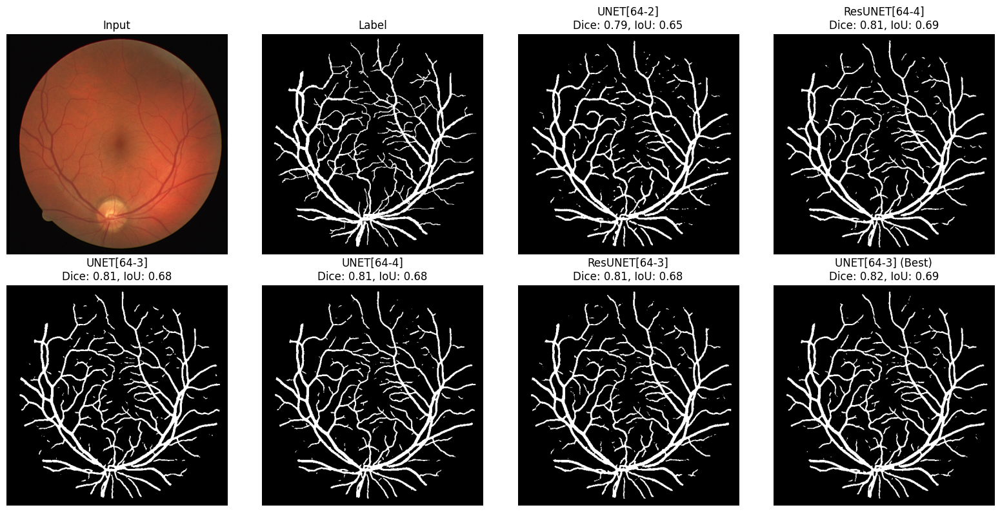

Evaluating: 100%|██████████| 20/20 [03:44<00:00, 11.23s/it]


In [156]:
for i, batch in enumerate(tqdm(test_loader, desc='Evaluating')):
    img = batch['image'].to(DEVICE)
    mask = batch['mask'].to(DEVICE)
    mask = convert_to_binary(mask, threshold=0.5, is_gt=True)
    dices, ious = {}, {}

    with torch.no_grad():
        preds = {}
        for model_name, model in models.items():
            pred = sliding_window_inference(
                inputs=img,
                roi_size=(128, 128),
                sw_batch_size=4,
                predictor=model,
                overlap=0.5,
                mode='gaussian'
            )
            pred = convert_to_binary(pred, threshold=THRESHOLD)
            preds[model_name] = pred

            dice, iou = compute_dice_iou_sample(mask, pred)
            dices[model_name] = dice
            ious[model_name] = iou
    
    save_path = RESULTS_DIR / f'{i+1}.png'
    visualize(img, mask, preds, dices, ious, save_path=save_path)            